In [9]:
%matplotlib inline

### Imports

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import random
import torchvision.transforms.functional as TF
from PIL import Image

# Set random seeds for reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

device = torch.device('cuda' if torch.cuda.is_available() else 
                      'mps' if torch.backends.mps.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: mps


## Helper train model function

In [37]:
def train_model(model, train_loader, val_loader, num_epochs=50, lr=0.001, label="Model"):
    """Train a model and return training history"""
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    
    history = {
        'train_loss': [], 'val_loss': [],
        'train_acc': [], 'val_acc': []
    }
    
    print(f"Training {label}...")
    print("-" * 70)
    
    for epoch in range(num_epochs):
        # Training
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for img_batch, mask_batch in train_loader:
            img_batch = img_batch.to(device)
            mask_batch = mask_batch.to(device)
            
            outputs = model(img_batch)
            loss = criterion(outputs, mask_batch)
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            preds = outputs.argmax(dim=1)
            correct += (preds == mask_batch).sum().item()
            total += mask_batch.numel()
        
        train_loss = running_loss / len(train_loader)
        train_acc = 100 * correct / total
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        
        # Validation
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for img_batch, mask_batch in val_loader:
                img_batch = img_batch.to(device)
                mask_batch = mask_batch.to(device)
                outputs = model(img_batch)
                loss = criterion(outputs, mask_batch)
                val_loss += loss.item()
                preds = outputs.argmax(dim=1)
                correct += (preds == mask_batch).sum().item()
                total += mask_batch.numel()
        
        val_loss /= len(val_loader)
        val_acc = 100 * correct / total
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        
        print(f"Epoch {epoch+1:2d}/{num_epochs} | "
              f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}% | "
              f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")
    
    print("-" * 70)
    print(f"{label} complete!\n")
    return history

print("train_model function defined")

train_model function defined


### Load image and mask

Image shape: (682, 1024, 3)
Mask shape: (682, 1024, 3)


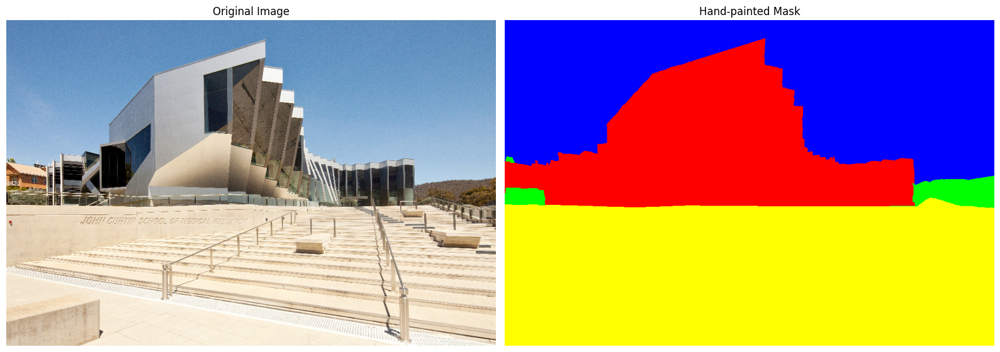

In [11]:
# Load the original image
image = cv2.imread('image_data.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (1024, 682))

# Load the mask you painted
mask_image = cv2.imread('mask.png')
mask_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB)
mask_image = cv2.resize(mask_image, (1024, 682), interpolation=cv2.INTER_NEAREST)

print(f"Image shape: {image.shape}")
print(f"Mask shape: {mask_image.shape}")

# Show both side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis('off')
axes[1].imshow(mask_image)
axes[1].set_title("Hand-painted Mask")
axes[1].axis('off')
plt.tight_layout()
plt.show()

Class distribution:
  building: 22.6%
  sky: 32.8%
  vegetation: 1.7%
  ground: 43.0%


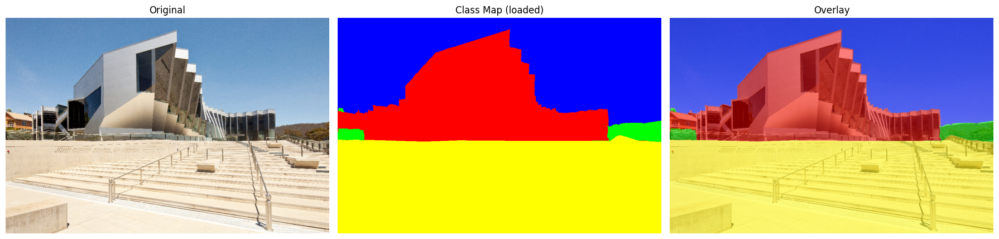

In [12]:
# Your colour to class mapping
# Red (255,0,0) = building (0)
# Blue (0,0,255) = sky (1)
# Green (0,255,0) = vegetation (2)
# Yellow (255,255,0) = ground (3)

CLASS_NAMES = ['building', 'sky', 'vegetation', 'ground']
NUM_CLASSES = 4

# Convert RGB mask to single-channel class label map
def rgb_to_class(mask_rgb):
    h, w, _ = mask_rgb.shape
    labels = np.zeros((h, w), dtype=np.int64)
    
    r = mask_rgb[:, :, 0]
    g = mask_rgb[:, :, 1]
    b = mask_rgb[:, :, 2]
    
    # Building: red dominant
    labels[(r > 200) & (g < 100) & (b < 100)] = 0
    # Sky: blue dominant
    labels[(b > 200) & (r < 100) & (g < 100)] = 1
    # Vegetation: green dominant
    labels[(g > 200) & (r < 100) & (b < 100)] = 2
    # Ground: red AND green high (yellow)
    labels[(r > 200) & (g > 200) & (b < 100)] = 3
    
    return labels

label_map = rgb_to_class(mask_image)

# Show class distribution
print("Class distribution:")
for i, name in enumerate(CLASS_NAMES):
    pct = (label_map == i).sum() / label_map.size * 100
    print(f"  {name}: {pct:.1f}%")

# Visualize the class map
class_colors = np.array([
    [255, 0, 0],    # building - red
    [0, 0, 255],    # sky - blue
    [0, 255, 0],    # vegetation - green
    [255, 255, 0],  # ground - yellow
]) / 255.0

color_map = class_colors[label_map]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image)
axes[0].set_title("Original")
axes[0].axis('off')
axes[1].imshow(color_map)
axes[1].set_title("Class Map (loaded)")
axes[1].axis('off')
axes[2].imshow(image)
axes[2].imshow(color_map, alpha=0.5)
axes[2].set_title("Overlay")
axes[2].axis('off')
plt.tight_layout()
plt.show()

## Build the dataset

In [21]:
class SegmentationDataset(Dataset):
    def __init__(self, image, label_map, patch_size=128, num_patches=2000, augment=True):
        self.image = image
        self.label_map = label_map
        self.patch_size = patch_size
        self.num_patches = num_patches
        self.augment = augment
        
        self.h, self.w, _ = image.shape
    
    def __len__(self):
        return self.num_patches
    
    def __getitem__(self, idx):
        # Random crop with random scale
        if self.augment:
            scale = random.uniform(0.7, 1.3)
            crop_size = int(self.patch_size * scale)
            crop_size = min(crop_size, min(self.h, self.w))
        else:
            crop_size = self.patch_size
        
        y = random.randint(0, self.h - crop_size)
        x = random.randint(0, self.w - crop_size)
        
        img_patch = self.image[y:y+crop_size, x:x+crop_size].copy()
        mask_patch = self.label_map[y:y+crop_size, x:x+crop_size].copy()
        
        # Resize back to patch_size if scaled
        if crop_size != self.patch_size:
            img_patch = cv2.resize(img_patch, (self.patch_size, self.patch_size), 
                                    interpolation=cv2.INTER_LINEAR)
            mask_patch = cv2.resize(mask_patch, (self.patch_size, self.patch_size), 
                                     interpolation=cv2.INTER_NEAREST)
        
        if self.augment:
            # Horizontal flip
            if random.random() > 0.5:
                img_patch = np.fliplr(img_patch).copy()
                mask_patch = np.fliplr(mask_patch).copy()
            # Vertical flip
            if random.random() > 0.5:
                img_patch = np.flipud(img_patch).copy()
                mask_patch = np.flipud(mask_patch).copy()
            # 90 degree rotations only (no small angles to avoid black bars)
            k = random.randint(0, 3)
            img_patch = np.rot90(img_patch, k).copy()
            mask_patch = np.rot90(mask_patch, k).copy()
            
            # Convert to PIL for colour augmentation
            img_pil = Image.fromarray(img_patch)
            
            # Brightness, contrast, saturation
            img_pil = TF.adjust_brightness(img_pil, random.uniform(0.7, 1.3))
            img_pil = TF.adjust_contrast(img_pil, random.uniform(0.7, 1.3))
            img_pil = TF.adjust_saturation(img_pil, random.uniform(0.7, 1.3))
            img_pil = TF.adjust_hue(img_pil, random.uniform(-0.05, 0.05))
            
            img_patch = np.array(img_pil)
            
            # Add gaussian noise
            if random.random() > 0.5:
                noise = np.random.normal(0, 5, img_patch.shape).astype(np.float32)
                img_patch = np.clip(img_patch.astype(np.float32) + noise, 0, 255).astype(np.uint8)
            
            # Random blur
            if random.random() > 0.7:
                ksize = random.choice([3, 5])
                img_patch = cv2.GaussianBlur(img_patch, (ksize, ksize), 0)
        
        # Normalize and convert to tensor
        img_patch = img_patch.astype(np.float32) / 255.0
        img_tensor = torch.from_numpy(img_patch).permute(2, 0, 1)
        mask_tensor = torch.from_numpy(mask_patch.astype(np.int64)).long()
        
        return img_tensor, mask_tensor

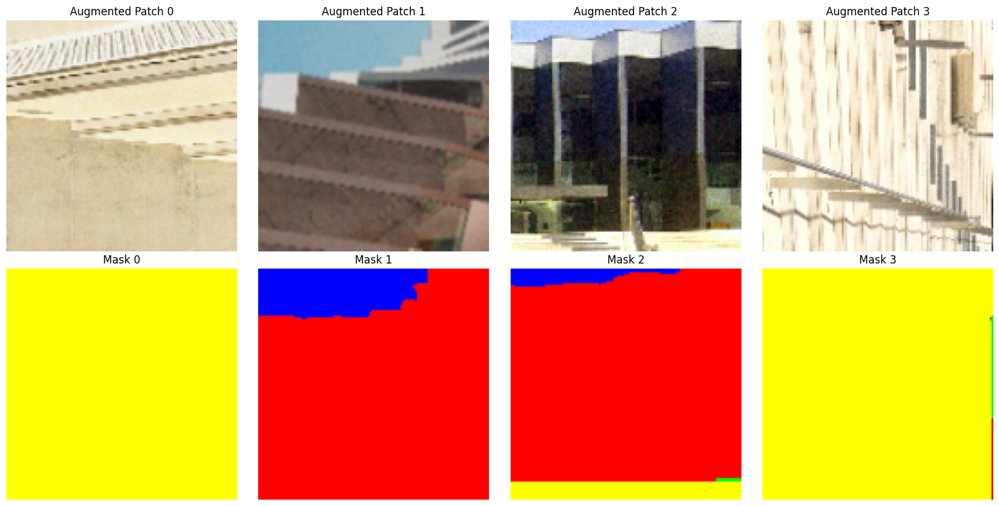

In [22]:
train_dataset = SegmentationDataset(image, label_map, patch_size=128, num_patches=2000, augment=True)
val_dataset = SegmentationDataset(image, label_map, patch_size=128, num_patches=200, augment=False)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

# Visualize a few augmented patches
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for i in range(4):
    img, mask = train_dataset[i]
    img_np = img.permute(1, 2, 0).numpy()
    mask_np = mask.numpy()
    
    axes[0, i].imshow(img_np)
    axes[0, i].set_title(f"Augmented Patch {i}")
    axes[0, i].axis('off')
    
    axes[1, i].imshow(class_colors[mask_np])
    axes[1, i].set_title(f"Mask {i}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

## Define the U-Net

In [23]:
# U-Net architecture
class DoubleConv(nn.Module):
    """Two 3x3 convolutions with ReLU, used at each level of the U-Net"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )
    
    def forward(self, x):
        return self.conv(x)


class UNet(nn.Module):
    def __init__(self, in_channels=3, num_classes=4):
        super().__init__()
        
        # Encoder (going down the U)
        self.enc1 = DoubleConv(in_channels, 32)
        self.enc2 = DoubleConv(32, 64)
        self.enc3 = DoubleConv(64, 128)
        self.enc4 = DoubleConv(128, 256)
        
        # Bottleneck (bottom of U)
        self.bottleneck = DoubleConv(256, 512)
        
        # Decoder (going up the U)
        self.up4 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(512, 256)  # 512 because of skip connection
        
        self.up3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(256, 128)
        
        self.up2 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(128, 64)
        
        self.up1 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(64, 32)
        
        # Final output: predict class for each pixel
        self.final = nn.Conv2d(32, num_classes, kernel_size=1)
        
        self.pool = nn.MaxPool2d(2)
    
    def forward(self, x):
        # Encoder path - save skip connections
        e1 = self.enc1(x)            # [B, 32, 128, 128]
        e2 = self.enc2(self.pool(e1)) # [B, 64, 64, 64]
        e3 = self.enc3(self.pool(e2)) # [B, 128, 32, 32]
        e4 = self.enc4(self.pool(e3)) # [B, 256, 16, 16]
        
        # Bottleneck
        b = self.bottleneck(self.pool(e4))  # [B, 512, 8, 8]
        
        # Decoder path - concatenate skip connections
        d4 = self.up4(b)                          # [B, 256, 16, 16]
        d4 = self.dec4(torch.cat([d4, e4], dim=1))  # skip from e4
        
        d3 = self.up3(d4)
        d3 = self.dec3(torch.cat([d3, e3], dim=1))
        
        d2 = self.up2(d3)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))
        
        d1 = self.up1(d2)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))
        
        # Final output: per-pixel class scores
        out = self.final(d1)
        return out

In [24]:
# Create the model
model = UNet(in_channels=3, num_classes=NUM_CLASSES).to(device)

total_params = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {total_params:,}")

# Test forward pass
dummy_input = torch.randn(2, 3, 128, 128).to(device)
output = model(dummy_input)
print(f"Input shape: {dummy_input.shape}")
print(f"Output shape: {output.shape}")  #

Total parameters: 7,766,084
Input shape: torch.Size([2, 3, 128, 128])
Output shape: torch.Size([2, 4, 128, 128])


## Train the model

Starting U-Net training...
----------------------------------------------------------------------
Epoch  1/50 | Train Loss: 0.5554 | Train Acc: 83.89% | Val Loss: 0.2783 | Val Acc: 92.41%
Epoch  2/50 | Train Loss: 0.3579 | Train Acc: 87.95% | Val Loss: 0.2072 | Val Acc: 93.53%
Epoch  3/50 | Train Loss: 0.3531 | Train Acc: 87.29% | Val Loss: 0.1971 | Val Acc: 92.52%
Epoch  4/50 | Train Loss: 0.2919 | Train Acc: 89.74% | Val Loss: 0.2170 | Val Acc: 92.27%
Epoch  5/50 | Train Loss: 0.2958 | Train Acc: 89.50% | Val Loss: 0.1812 | Val Acc: 93.71%
Epoch  6/50 | Train Loss: 0.2586 | Train Acc: 91.05% | Val Loss: 0.2016 | Val Acc: 94.00%
Epoch  7/50 | Train Loss: 0.2524 | Train Acc: 91.36% | Val Loss: 0.1623 | Val Acc: 94.81%
Epoch  8/50 | Train Loss: 0.2512 | Train Acc: 91.42% | Val Loss: 0.1197 | Val Acc: 96.59%
Epoch  9/50 | Train Loss: 0.2088 | Train Acc: 92.91% | Val Loss: 0.1359 | Val Acc: 95.53%
Epoch 10/50 | Train Loss: 0.1907 | Train Acc: 93.57% | Val Loss: 0.1534 | Val Acc: 93.40%
Ep

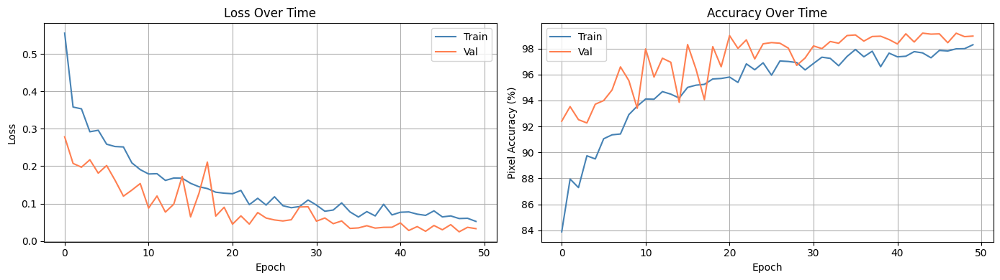

In [25]:
# Training setup
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

num_epochs = 50

print("Starting U-Net training...")
print("-" * 70)

for epoch in range(num_epochs):
    # Training
    model.train()
    running_loss = 0.0
    correct_pixels = 0
    total_pixels = 0
    
    for img_batch, mask_batch in train_loader:
        img_batch = img_batch.to(device)
        mask_batch = mask_batch.to(device)
        
        # Forward
        outputs = model(img_batch)  # [B, 4, 128, 128]
        loss = criterion(outputs, mask_batch)
        
        # Backward
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        
        # Per-pixel accuracy
        preds = outputs.argmax(dim=1)
        correct_pixels += (preds == mask_batch).sum().item()
        total_pixels += mask_batch.numel()
    
    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct_pixels / total_pixels
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)
    
    # Validation
    model.eval()
    val_loss = 0.0
    correct_pixels = 0
    total_pixels = 0
    
    with torch.no_grad():
        for img_batch, mask_batch in val_loader:
            img_batch = img_batch.to(device)
            mask_batch = mask_batch.to(device)
            outputs = model(img_batch)
            loss = criterion(outputs, mask_batch)
            val_loss += loss.item()
            
            preds = outputs.argmax(dim=1)
            correct_pixels += (preds == mask_batch).sum().item()
            total_pixels += mask_batch.numel()
    
    val_loss /= len(val_loader)
    val_acc = 100 * correct_pixels / total_pixels
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)
    
    print(f"Epoch {epoch+1:2d}/{num_epochs} | "
          f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}% | "
          f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")

print("-" * 70)
print("Training complete!")

# Plot curves
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

axes[0].plot(train_losses, label='Train', color='steelblue')
axes[0].plot(val_losses, label='Val', color='coral')
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].set_title("Loss Over Time")
axes[0].legend()
axes[0].grid(True)

axes[1].plot(train_accuracies, label='Train', color='steelblue')
axes[1].plot(val_accuracies, label='Val', color='coral')
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Pixel Accuracy (%)")
axes[1].set_title("Accuracy Over Time")
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
plt.show()

## Segment the full image

In [26]:
def segment_full_image(model, image, patch_size=128, stride=32):
    """Slide window across the full image and aggregate predictions"""
    model.eval()
    h, w, _ = image.shape
    
    # We'll accumulate logits and counts at each pixel
    # Then average them at the end
    logit_sum = np.zeros((NUM_CLASSES, h, w), dtype=np.float32)
    count_map = np.zeros((h, w), dtype=np.float32)
    
    print("Generating full segmentation...")
    
    # Collect patches
    patches = []
    positions = []
    for y in range(0, h - patch_size + 1, stride):
        for x in range(0, w - patch_size + 1, stride):
            patches.append(image[y:y+patch_size, x:x+patch_size])
            positions.append((y, x))
    
    # Also handle right and bottom edges (in case dimensions don't divide evenly)
    last_y = h - patch_size
    last_x = w - patch_size
    for x in range(0, w - patch_size + 1, stride):
        patches.append(image[last_y:last_y+patch_size, x:x+patch_size])
        positions.append((last_y, x))
    for y in range(0, h - patch_size + 1, stride):
        patches.append(image[y:y+patch_size, last_x:last_x+patch_size])
        positions.append((y, last_x))
    patches.append(image[last_y:last_y+patch_size, last_x:last_x+patch_size])
    positions.append((last_y, last_x))
    
    print(f"Total patches to predict: {len(patches)}")
    
    # Process in batches
    batch_size = 16
    with torch.no_grad():
        for batch_start in range(0, len(patches), batch_size):
            batch = patches[batch_start:batch_start+batch_size]
            batch_tensor = np.stack(batch).astype(np.float32) / 255.0
            batch_tensor = torch.from_numpy(batch_tensor).permute(0, 3, 1, 2).to(device)
            
            outputs = model(batch_tensor)  # [B, 4, 128, 128]
            outputs = torch.softmax(outputs, dim=1).cpu().numpy()
            
            for k, (y, x) in enumerate(positions[batch_start:batch_start+batch_size]):
                logit_sum[:, y:y+patch_size, x:x+patch_size] += outputs[k]
                count_map[y:y+patch_size, x:x+patch_size] += 1
    
    # Average overlapping predictions
    avg_probs = logit_sum / count_map[None, :, :]
    
    # Take argmax for final prediction
    prediction = avg_probs.argmax(axis=0)
    confidence = avg_probs.max(axis=0)
    
    return prediction, confidence

Generating full segmentation...
Total patches to predict: 570


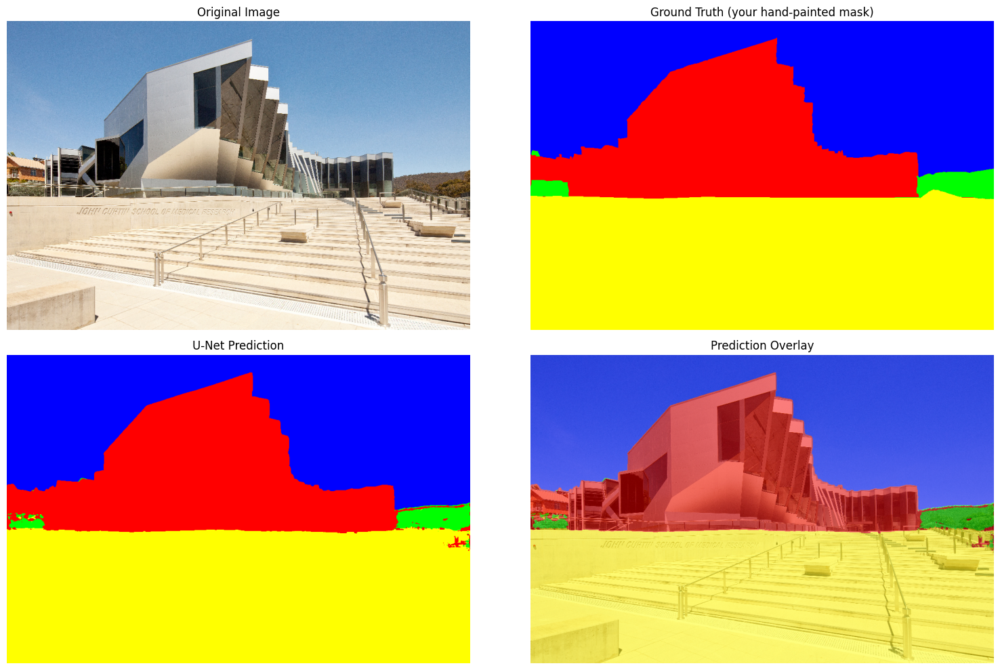


Full image pixel accuracy: 99.08%

Per-class IoU:
  building: IoU=96.83% | Predicted: 23.1% | GT: 22.6%
  sky: IoU=99.36% | Predicted: 32.8% | GT: 32.8%
  vegetation: IoU=69.64% | Predicted: 1.3% | GT: 1.7%
  ground: IoU=99.16% | Predicted: 42.9% | GT: 43.0%


In [27]:
# Run segmentation
prediction, confidence = segment_full_image(model, image, patch_size=128, stride=32)

# Convert prediction to coloured visualisation
pred_color = class_colors[prediction]

# Compare against ground truth
gt_color = class_colors[label_map]

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

axes[0, 0].imshow(image)
axes[0, 0].set_title("Original Image")
axes[0, 0].axis('off')

axes[0, 1].imshow(gt_color)
axes[0, 1].set_title("Ground Truth (your hand-painted mask)")
axes[0, 1].axis('off')

axes[1, 0].imshow(pred_color)
axes[1, 0].set_title("U-Net Prediction")
axes[1, 0].axis('off')

axes[1, 1].imshow(image)
axes[1, 1].imshow(pred_color, alpha=0.5)
axes[1, 1].set_title("Prediction Overlay")
axes[1, 1].axis('off')

plt.tight_layout()
plt.savefig('main_segmentation.png', dpi=150, bbox_inches='tight')
plt.show()

# Compute pixel accuracy on full image
pixel_acc = (prediction == label_map).mean() * 100
print(f"\nFull image pixel accuracy: {pixel_acc:.2f}%")

# Per-class accuracy (Intersection over Union)
print("\nPer-class IoU:")
for i, name in enumerate(CLASS_NAMES):
    intersection = ((prediction == i) & (label_map == i)).sum()
    union = ((prediction == i) | (label_map == i)).sum()
    iou = intersection / (union + 1e-10) * 100
    pct_pred = (prediction == i).mean() * 100
    pct_gt = (label_map == i).mean() * 100
    print(f"  {name}: IoU={iou:.2f}% | Predicted: {pct_pred:.1f}% | GT: {pct_gt:.1f}%")

## More robust data experiment

### Distortion

In [29]:
def apply_distortion(image, distortion_type, severity):
    """Apply different types of distortions at varying severities"""
    img = image.copy().astype(np.float32)
    
    if distortion_type == 'blur':
        # severity: 1=mild, 5=severe
        ksize = severity * 2 + 1  # 3, 5, 7, 9, 11
        img = cv2.GaussianBlur(img, (ksize, ksize), 0)
    
    elif distortion_type == 'noise':
        # severity: 1=mild, 5=severe
        std = severity * 10  # 10, 20, 30, 40, 50
        noise = np.random.normal(0, std, img.shape)
        img = img + noise
    
    elif distortion_type == 'brightness':
        # severity: 1=slightly dimmer, 5=very dim
        factor = 1.0 - severity * 0.15  # 0.85, 0.70, 0.55, 0.40, 0.25
        img = img * factor
    
    elif distortion_type == 'contrast':
        # severity: 1=mild, 5=severe contrast reduction
        factor = 1.0 - severity * 0.15
        mean = img.mean()
        img = (img - mean) * factor + mean
    
    elif distortion_type == 'jpeg':
        # JPEG compression artifacts
        quality = max(5, 100 - severity * 18)  # 82, 64, 46, 28, 10
        encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), quality]
        result, encoded = cv2.imencode('.jpg', img.astype(np.uint8), encode_param)
        img = cv2.imdecode(encoded, 1).astype(np.float32)
    
    img = np.clip(img, 0, 255).astype(np.uint8)
    return img

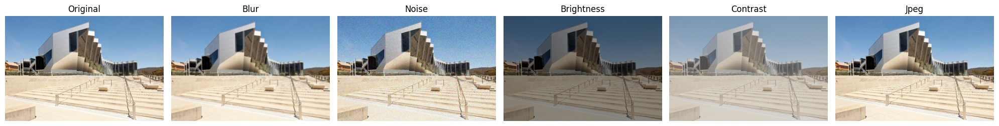

Distortion examples generated.


In [30]:
# Visualize distortions at severity 3 (medium)
distortions = ['blur', 'noise', 'brightness', 'contrast', 'jpeg']

fig, axes = plt.subplots(1, 6, figsize=(20, 4))
axes[0].imshow(image)
axes[0].set_title("Original")
axes[0].axis('off')

for i, dtype in enumerate(distortions):
    distorted = apply_distortion(image, dtype, severity=3)
    axes[i+1].imshow(distorted)
    axes[i+1].set_title(f"{dtype.capitalize()}")
    axes[i+1].axis('off')

plt.tight_layout()
plt.savefig('distortion_examples.png', dpi=150, bbox_inches='tight')
plt.show()

print("Distortion examples generated.")

### Evaluate the robustness


In [32]:
# Run the model on each distortion at all severity levels
print("Running robustness experiment...")
print("This will take a few minutes")
print("-" * 70)

results = {}  # dict of distortion -> list of (severity, pixel_acc, building_iou, sky_iou, veg_iou, ground_iou)

severities = [0, 1, 2, 3, 4, 5]  # 0 = no distortion (baseline)

for dtype in ['original'] + distortions:
    print(f"\nTesting: {dtype}")
    results[dtype] = []
    
    for severity in severities:
        # Skip non-zero severities for "original"
        if dtype == 'original' and severity > 0:
            continue
        if dtype != 'original' and severity == 0:
            continue
        
        # Apply distortion
        if dtype == 'original':
            test_image = image.copy()
        else:
            test_image = apply_distortion(image, dtype, severity)
        
        # Run model
        prediction, _ = segment_full_image(model, test_image, patch_size=128, stride=64)
        
        # Compute metrics
        pixel_acc = (prediction == label_map).mean() * 100
        
        ious = []
        for i in range(NUM_CLASSES):
            intersection = ((prediction == i) & (label_map == i)).sum()
            union = ((prediction == i) | (label_map == i)).sum()
            iou = intersection / (union + 1e-10) * 100
            ious.append(iou)
        
        mean_iou = np.mean(ious)
        
        results[dtype].append({
            'severity': severity,
            'pixel_acc': pixel_acc,
            'mean_iou': mean_iou,
            'building_iou': ious[0],
            'sky_iou': ious[1],
            'veg_iou': ious[2],
            'ground_iou': ious[3]
        })
        
        print(f"  Severity {severity}: Pixel Acc={pixel_acc:.2f}% | Mean IoU={mean_iou:.2f}%")

print("\nDone!")

Running robustness experiment...
This will take a few minutes
----------------------------------------------------------------------

Testing: original
Generating full segmentation...
Total patches to predict: 160
  Severity 0: Pixel Acc=99.08% | Mean IoU=91.51%

Testing: blur
Generating full segmentation...
Total patches to predict: 160
  Severity 1: Pixel Acc=99.03% | Mean IoU=89.75%
Generating full segmentation...
Total patches to predict: 160
  Severity 2: Pixel Acc=98.97% | Mean IoU=89.17%
Generating full segmentation...
Total patches to predict: 160
  Severity 3: Pixel Acc=98.80% | Mean IoU=87.40%
Generating full segmentation...
Total patches to predict: 160
  Severity 4: Pixel Acc=98.47% | Mean IoU=85.66%
Generating full segmentation...
Total patches to predict: 160
  Severity 5: Pixel Acc=98.08% | Mean IoU=83.44%

Testing: noise
Generating full segmentation...
Total patches to predict: 160
  Severity 1: Pixel Acc=98.99% | Mean IoU=91.47%
Generating full segmentation...
Total pa

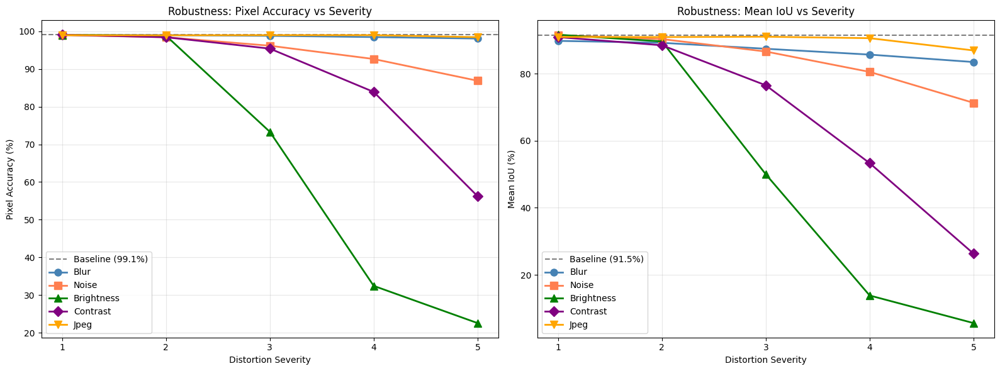


ROBUSTNESS SUMMARY TABLE
Distortion   Severity   Pixel Acc    Mean IoU    
--------------------------------------------------------------------------------
Original     -          99.08        91.51       
blur         1          99.03        89.75       
blur         2          98.97        89.17       
blur         3          98.80        87.40       
blur         4          98.47        85.66       
blur         5          98.08        83.44       
noise        1          98.99        91.47       
noise        2          98.43        90.28       
noise        3          96.17        86.57       
noise        4          92.64        80.50       
noise        5          86.87        71.28       
brightness   1          99.03        91.57       
brightness   2          98.84        89.58       
brightness   3          73.33        49.97       
brightness   4          32.44        13.86       
brightness   5          22.56        5.64        
contrast     1          99.07        90.86 

In [33]:
# Plot how each metric degrades as severity increases
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

baseline_acc = results['original'][0]['pixel_acc']
baseline_iou = results['original'][0]['mean_iou']

colors = {'blur': 'steelblue', 'noise': 'coral', 'brightness': 'green', 
          'contrast': 'purple', 'jpeg': 'orange'}
markers = {'blur': 'o', 'noise': 's', 'brightness': '^', 
           'contrast': 'D', 'jpeg': 'v'}

# Plot pixel accuracy
ax = axes[0]
ax.axhline(y=baseline_acc, color='black', linestyle='--', alpha=0.5, label=f'Baseline ({baseline_acc:.1f}%)')

for dtype in distortions:
    severities_list = [r['severity'] for r in results[dtype]]
    accs = [r['pixel_acc'] for r in results[dtype]]
    ax.plot(severities_list, accs, color=colors[dtype], marker=markers[dtype], 
            label=dtype.capitalize(), linewidth=2, markersize=8)

ax.set_xlabel("Distortion Severity")
ax.set_ylabel("Pixel Accuracy (%)")
ax.set_title("Robustness: Pixel Accuracy vs Severity")
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_xticks([1, 2, 3, 4, 5])

# Plot mean IoU
ax = axes[1]
ax.axhline(y=baseline_iou, color='black', linestyle='--', alpha=0.5, label=f'Baseline ({baseline_iou:.1f}%)')

for dtype in distortions:
    severities_list = [r['severity'] for r in results[dtype]]
    ious = [r['mean_iou'] for r in results[dtype]]
    ax.plot(severities_list, ious, color=colors[dtype], marker=markers[dtype], 
            label=dtype.capitalize(), linewidth=2, markersize=8)

ax.set_xlabel("Distortion Severity")
ax.set_ylabel("Mean IoU (%)")
ax.set_title("Robustness: Mean IoU vs Severity")
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_xticks([1, 2, 3, 4, 5])

plt.tight_layout()
plt.savefig('robustness_curves.png', dpi=150, bbox_inches='tight')
plt.show()

# Print summary table
print("\n" + "=" * 80)
print("ROBUSTNESS SUMMARY TABLE")
print("=" * 80)
print(f"{'Distortion':<12} {'Severity':<10} {'Pixel Acc':<12} {'Mean IoU':<12}")
print("-" * 80)
print(f"{'Original':<12} {'-':<10} {baseline_acc:<12.2f} {baseline_iou:<12.2f}")
for dtype in distortions:
    for r in results[dtype]:
        print(f"{dtype:<12} {r['severity']:<10} {r['pixel_acc']:<12.2f} {r['mean_iou']:<12.2f}")
print("=" * 80)

### Retrain with better augmentation
Due to the model failing on brightness and contrast distortion, thus we need better augmentation

In [35]:
# Save the current model first so we can compare
import copy
model_v1 = copy.deepcopy(model)
print("Saved current model as model_v1 (for comparison)")

# Now create a new dataset with WIDER augmentation
class SegmentationDatasetWide(Dataset):
    def __init__(self, image, label_map, patch_size=128, num_patches=2000, augment=True):
        self.image = image
        self.label_map = label_map
        self.patch_size = patch_size
        self.num_patches = num_patches
        self.augment = augment
        self.h, self.w, _ = image.shape
    
    def __len__(self):
        return self.num_patches
    
    def __getitem__(self, idx):
        if self.augment:
            scale = random.uniform(0.7, 1.3)
            crop_size = int(self.patch_size * scale)
            crop_size = min(crop_size, min(self.h, self.w))
        else:
            crop_size = self.patch_size
        
        y = random.randint(0, self.h - crop_size)
        x = random.randint(0, self.w - crop_size)
        
        img_patch = self.image[y:y+crop_size, x:x+crop_size].copy()
        mask_patch = self.label_map[y:y+crop_size, x:x+crop_size].copy()
        
        if crop_size != self.patch_size:
            img_patch = cv2.resize(img_patch, (self.patch_size, self.patch_size), 
                                    interpolation=cv2.INTER_LINEAR)
            mask_patch = cv2.resize(mask_patch, (self.patch_size, self.patch_size), 
                                     interpolation=cv2.INTER_NEAREST)
        
        if self.augment:
            if random.random() > 0.5:
                img_patch = np.fliplr(img_patch).copy()
                mask_patch = np.fliplr(mask_patch).copy()
            if random.random() > 0.5:
                img_patch = np.flipud(img_patch).copy()
                mask_patch = np.flipud(mask_patch).copy()
            k = random.randint(0, 3)
            img_patch = np.rot90(img_patch, k).copy()
            mask_patch = np.rot90(mask_patch, k).copy()
            
            img_pil = Image.fromarray(img_patch)
            
            # WIDER ranges this time
            img_pil = TF.adjust_brightness(img_pil, random.uniform(0.3, 1.5))   # was 0.7-1.3
            img_pil = TF.adjust_contrast(img_pil, random.uniform(0.3, 1.5))     # was 0.7-1.3
            img_pil = TF.adjust_saturation(img_pil, random.uniform(0.5, 1.5))   # was 0.7-1.3
            img_pil = TF.adjust_hue(img_pil, random.uniform(-0.1, 0.1))         # was -0.05 to 0.05
            
            img_patch = np.array(img_pil)
            
            if random.random() > 0.5:
                noise = np.random.normal(0, random.uniform(5, 15), img_patch.shape).astype(np.float32)
                img_patch = np.clip(img_patch.astype(np.float32) + noise, 0, 255).astype(np.uint8)
            
            if random.random() > 0.7:
                ksize = random.choice([3, 5, 7])
                img_patch = cv2.GaussianBlur(img_patch, (ksize, ksize), 0)
        
        img_patch = img_patch.astype(np.float32) / 255.0
        img_tensor = torch.from_numpy(img_patch).permute(2, 0, 1)
        mask_tensor = torch.from_numpy(mask_patch.astype(np.int64)).long()
        
        return img_tensor, mask_tensor

Saved current model as model_v1 (for comparison)


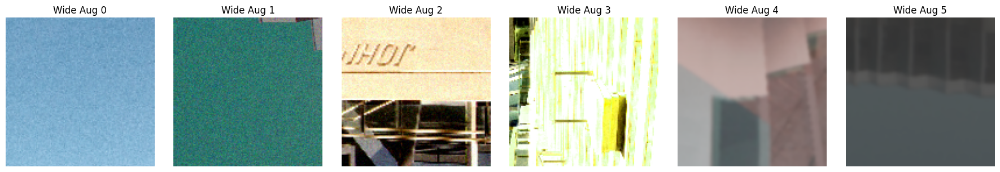

In [36]:
# New datasets with wider augmentation
train_dataset_wide = SegmentationDatasetWide(image, label_map, patch_size=128, num_patches=2000, augment=True)
val_dataset_wide = SegmentationDatasetWide(image, label_map, patch_size=128, num_patches=200, augment=False)

train_loader_wide = DataLoader(train_dataset_wide, batch_size=16, shuffle=True)
val_loader_wide = DataLoader(val_dataset_wide, batch_size=16, shuffle=False)

# Visualize new augmentation
fig, axes = plt.subplots(1, 6, figsize=(18, 3))
for i in range(6):
    img, mask = train_dataset_wide[i]
    img_np = img.permute(1, 2, 0).numpy()
    axes[i].imshow(img_np)
    axes[i].set_title(f"Wide Aug {i}")
    axes[i].axis('off')
plt.tight_layout()
plt.show()

### Retrain

In [38]:
# Create fresh model and train it
model_v2 = UNet(in_channels=3, num_classes=NUM_CLASSES).to(device)
history_v2 = train_model(model_v2, train_loader_wide, val_loader_wide, num_epochs=50, label="V2 (wide augmentation)")

Training V2 (wide augmentation)...
----------------------------------------------------------------------
Epoch  1/50 | Train Loss: 0.7093 | Train Acc: 72.75% | Val Loss: 0.4214 | Val Acc: 81.99%
Epoch  2/50 | Train Loss: 0.6060 | Train Acc: 75.40% | Val Loss: 0.4144 | Val Acc: 82.98%
Epoch  3/50 | Train Loss: 0.5674 | Train Acc: 76.79% | Val Loss: 0.3661 | Val Acc: 85.51%
Epoch  4/50 | Train Loss: 0.5078 | Train Acc: 79.99% | Val Loss: 0.2549 | Val Acc: 92.44%
Epoch  5/50 | Train Loss: 0.5180 | Train Acc: 79.75% | Val Loss: 0.2511 | Val Acc: 90.55%
Epoch  6/50 | Train Loss: 0.5047 | Train Acc: 81.03% | Val Loss: 0.4441 | Val Acc: 81.95%
Epoch  7/50 | Train Loss: 0.4739 | Train Acc: 81.33% | Val Loss: 0.2803 | Val Acc: 89.41%
Epoch  8/50 | Train Loss: 0.4629 | Train Acc: 82.15% | Val Loss: 0.4544 | Val Acc: 79.62%
Epoch  9/50 | Train Loss: 0.4432 | Train Acc: 83.46% | Val Loss: 0.2137 | Val Acc: 92.03%
Epoch 10/50 | Train Loss: 0.4329 | Train Acc: 83.61% | Val Loss: 0.1524 | Val Acc: 9

In [39]:
# Run robustness experiment on V2 using same code structure as before
print("Running robustness experiment on V2...")
print("-" * 70)

results_v2 = {}

for dtype in ['original'] + distortions:
    print(f"\nTesting V2: {dtype}")
    results_v2[dtype] = []
    
    for severity in severities:
        if dtype == 'original' and severity > 0:
            continue
        if dtype != 'original' and severity == 0:
            continue
        
        if dtype == 'original':
            test_image = image.copy()
        else:
            test_image = apply_distortion(image, dtype, severity)
        
        prediction, _ = segment_full_image(model_v2, test_image, patch_size=128, stride=64)
        
        pixel_acc = (prediction == label_map).mean() * 100
        ious = []
        for i in range(NUM_CLASSES):
            intersection = ((prediction == i) & (label_map == i)).sum()
            union = ((prediction == i) | (label_map == i)).sum()
            iou = intersection / (union + 1e-10) * 100
            ious.append(iou)
        mean_iou = np.mean(ious)
        
        results_v2[dtype].append({
            'severity': severity,
            'pixel_acc': pixel_acc,
            'mean_iou': mean_iou,
            'building_iou': ious[0],
            'sky_iou': ious[1],
            'veg_iou': ious[2],
            'ground_iou': ious[3]
        })
        
        print(f"  Severity {severity}: Pixel Acc={pixel_acc:.2f}% | Mean IoU={mean_iou:.2f}%")

print("\nDone!")

Running robustness experiment on V2...
----------------------------------------------------------------------

Testing V2: original
Generating full segmentation...
Total patches to predict: 160
  Severity 0: Pixel Acc=96.51% | Mean IoU=70.61%

Testing V2: blur
Generating full segmentation...
Total patches to predict: 160
  Severity 1: Pixel Acc=96.20% | Mean IoU=70.10%
Generating full segmentation...
Total patches to predict: 160
  Severity 2: Pixel Acc=95.93% | Mean IoU=69.71%
Generating full segmentation...
Total patches to predict: 160
  Severity 3: Pixel Acc=95.30% | Mean IoU=68.85%
Generating full segmentation...
Total patches to predict: 160
  Severity 4: Pixel Acc=94.79% | Mean IoU=68.16%
Generating full segmentation...
Total patches to predict: 160
  Severity 5: Pixel Acc=94.37% | Mean IoU=67.60%

Testing V2: noise
Generating full segmentation...
Total patches to predict: 160
  Severity 1: Pixel Acc=96.52% | Mean IoU=70.64%
Generating full segmentation...
Total patches to predi

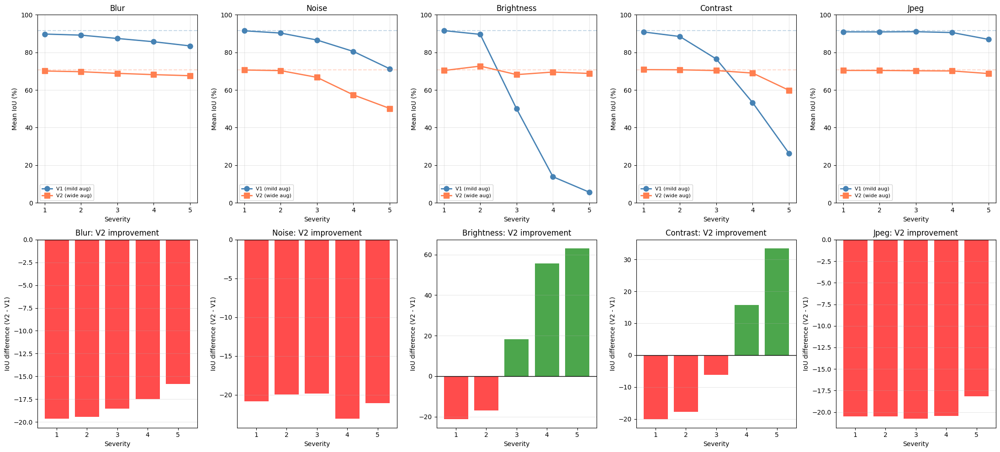


V1 vs V2 ROBUSTNESS COMPARISON (Mean IoU)
Distortion   Severity   V1 IoU       V2 IoU       Improvement    
------------------------------------------------------------------------------------------
Original     -          91.51        70.61        -20.90
blur         1          89.75        70.10        -19.65
blur         2          89.17        69.71        -19.45
blur         3          87.40        68.85        -18.55
blur         4          85.66        68.16        -17.49
blur         5          83.44        67.60        -15.84
noise        1          91.47        70.64        -20.83
noise        2          90.28        70.30        -19.98
noise        3          86.57        66.72        -19.85
noise        4          80.50        57.40        -23.10
noise        5          71.28        50.19        -21.09
brightness   1          91.57        70.34        -21.23
brightness   2          89.58        72.69        -16.89
brightness   3          49.97        68.18        +18.20
br

In [40]:
# Compare V1 vs V2 robustness side by side
fig, axes = plt.subplots(2, 5, figsize=(22, 10))

baseline_v1 = results['original'][0]['mean_iou']
baseline_v2 = results_v2['original'][0]['mean_iou']

for col, dtype in enumerate(distortions):
    # Top row: V1 vs V2 mean IoU for this distortion
    ax = axes[0, col]
    severities_list = [r['severity'] for r in results[dtype]]
    
    v1_ious = [r['mean_iou'] for r in results[dtype]]
    v2_ious = [r['mean_iou'] for r in results_v2[dtype]]
    
    ax.plot(severities_list, v1_ious, 'o-', color='steelblue', label='V1 (mild aug)', linewidth=2, markersize=8)
    ax.plot(severities_list, v2_ious, 's-', color='coral', label='V2 (wide aug)', linewidth=2, markersize=8)
    ax.axhline(y=baseline_v1, color='steelblue', linestyle='--', alpha=0.3)
    ax.axhline(y=baseline_v2, color='coral', linestyle='--', alpha=0.3)
    
    ax.set_title(f"{dtype.capitalize()}")
    ax.set_xlabel("Severity")
    ax.set_ylabel("Mean IoU (%)")
    ax.legend(loc='lower left', fontsize=8)
    ax.grid(True, alpha=0.3)
    ax.set_xticks([1, 2, 3, 4, 5])
    ax.set_ylim(0, 100)
    
    # Bottom row: improvement (V2 - V1)
    ax = axes[1, col]
    improvements = [v2 - v1 for v1, v2 in zip(v1_ious, v2_ious)]
    colors = ['green' if x > 0 else 'red' for x in improvements]
    ax.bar(severities_list, improvements, color=colors, alpha=0.7)
    ax.axhline(y=0, color='black', linewidth=1)
    ax.set_title(f"{dtype.capitalize()}: V2 improvement")
    ax.set_xlabel("Severity")
    ax.set_ylabel("IoU difference (V2 - V1)")
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_xticks([1, 2, 3, 4, 5])

plt.tight_layout()
plt.savefig('v1_vs_v2_robustness.png', dpi=150, bbox_inches='tight')
plt.show()

# Print numerical comparison
print("\n" + "=" * 90)
print("V1 vs V2 ROBUSTNESS COMPARISON (Mean IoU)")
print("=" * 90)
print(f"{'Distortion':<12} {'Severity':<10} {'V1 IoU':<12} {'V2 IoU':<12} {'Improvement':<15}")
print("-" * 90)
print(f"{'Original':<12} {'-':<10} {baseline_v1:<12.2f} {baseline_v2:<12.2f} {baseline_v2-baseline_v1:+.2f}")
for dtype in distortions:
    for r1, r2 in zip(results[dtype], results_v2[dtype]):
        diff = r2['mean_iou'] - r1['mean_iou']
        print(f"{dtype:<12} {r1['severity']:<10} {r1['mean_iou']:<12.2f} {r2['mean_iou']:<12.2f} {diff:+.2f}")
print("=" * 90)

Generating full segmentation...
Total patches to predict: 570
Generating full segmentation...
Total patches to predict: 570


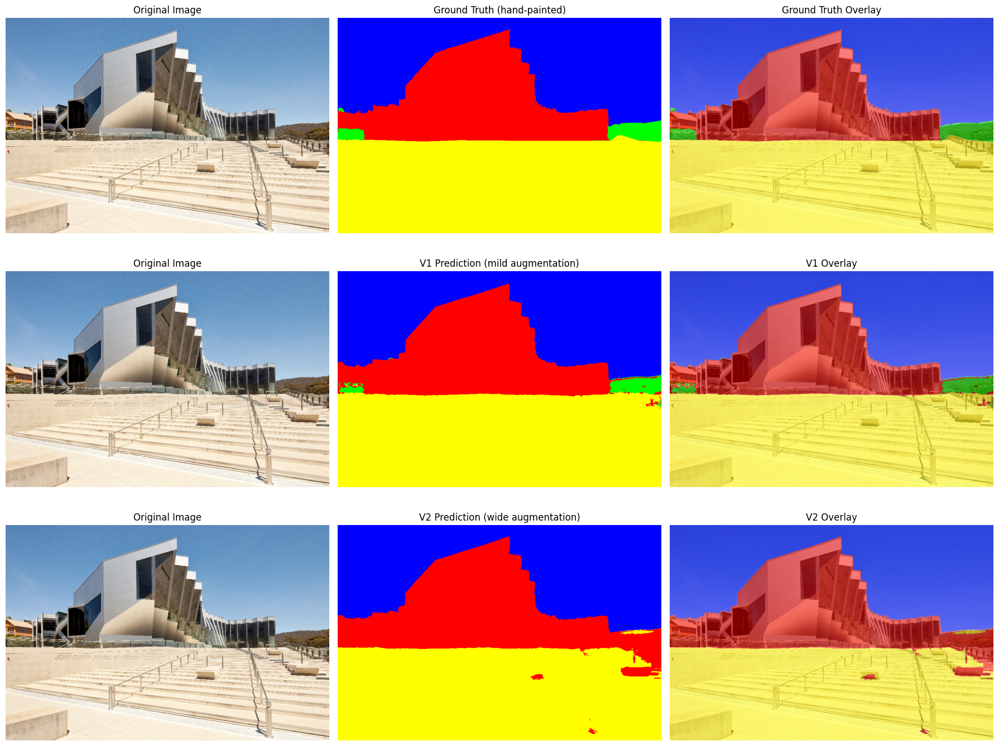


V1 vs V2 SEGMENTATION METRICS (clean image)

V1:
  Pixel Accuracy: 99.08%
  Mean IoU: 91.25%
    building: 96.83%
    sky: 99.36%
    vegetation: 69.64%
    ground: 99.16%

V2:
  Pixel Accuracy: 96.52%
  Mean IoU: 70.59%
    building: 87.10%
    sky: 99.16%
    vegetation: 0.00%
    ground: 96.12%



In [43]:
# Generate both predictions on clean image
prediction_v1, _ = segment_full_image(model_v1, image, patch_size=128, stride=32)
prediction_v2, _ = segment_full_image(model_v2, image, patch_size=128, stride=32)

pred_color_v1 = class_colors[prediction_v1]
pred_color_v2 = class_colors[prediction_v2]
gt_color = class_colors[label_map]

fig, axes = plt.subplots(3, 3, figsize=(18, 14))

axes[0, 0].imshow(image)
axes[0, 0].set_title("Original Image", fontsize=12)
axes[0, 0].axis('off')

axes[0, 1].imshow(gt_color)
axes[0, 1].set_title("Ground Truth (hand-painted)", fontsize=12)
axes[0, 1].axis('off')

axes[0, 2].imshow(image)
axes[0, 2].imshow(gt_color, alpha=0.5)
axes[0, 2].set_title("Ground Truth Overlay", fontsize=12)
axes[0, 2].axis('off')

axes[1, 0].imshow(image)
axes[1, 0].set_title("Original Image", fontsize=12)
axes[1, 0].axis('off')

axes[1, 1].imshow(pred_color_v1)
axes[1, 1].set_title("V1 Prediction (mild augmentation)", fontsize=12)
axes[1, 1].axis('off')

axes[1, 2].imshow(image)
axes[1, 2].imshow(pred_color_v1, alpha=0.5)
axes[1, 2].set_title("V1 Overlay", fontsize=12)
axes[1, 2].axis('off')

axes[2, 0].imshow(image)
axes[2, 0].set_title("Original Image", fontsize=12)
axes[2, 0].axis('off')

axes[2, 1].imshow(pred_color_v2)
axes[2, 1].set_title("V2 Prediction (wide augmentation)", fontsize=12)
axes[2, 1].axis('off')

axes[2, 2].imshow(image)
axes[2, 2].imshow(pred_color_v2, alpha=0.5)
axes[2, 2].set_title("V2 Overlay", fontsize=12)
axes[2, 2].axis('off')

plt.tight_layout()
plt.savefig('v1_vs_v2_segmentation.png', dpi=150, bbox_inches='tight')
plt.show()

# Metrics for both
print("\n" + "=" * 70)
print("V1 vs V2 SEGMENTATION METRICS (clean image)")
print("=" * 70)

for label_name, pred in [('V1', prediction_v1), ('V2', prediction_v2)]:
    pixel_acc = (pred == label_map).mean() * 100
    ious = []
    for i in range(NUM_CLASSES):
        intersection = ((pred == i) & (label_map == i)).sum()
        union = ((pred == i) | (label_map == i)).sum()
        iou = intersection / (union + 1e-10) * 100
        ious.append(iou)
    mean_iou = np.mean(ious)
    
    print(f"\n{label_name}:")
    print(f"  Pixel Accuracy: {pixel_acc:.2f}%")
    print(f"  Mean IoU: {mean_iou:.2f}%")
    for i, name in enumerate(CLASS_NAMES):
        print(f"    {name}: {ious[i]:.2f}%")

print("\n" + "=" * 70)